In [1]:
import os
import numpy as np
from scipy.signal import *
from scipy.fft import fft
import matplotlib
import matplotlib.pyplot as plt
import csv
import pandas as pd
from sklearn.model_selection import train_test_split
from keras.models import Sequential
import keras.layers as layers
from keras.optimizers import SGD
from keras.initializers import random_uniform
from keras.callbacks import EarlyStopping
from google.colab import drive
import random
import seaborn as sns
import tensorflow as tf
from sklearn.model_selection import StratifiedKFold
from sklearn import metrics

In [9]:
drive.mount('/content/gdrive')
data_path_mohab_old = 'gdrive/MyDrive/Blinking_CNN_Data/mohab/old/'
data_path_mohab = 'gdrive/MyDrive/Blinking_CNN_Data/mohab/'
data_path_mansour = 'gdrive/MyDrive/Blinking_CNN_Data/mans/'
data_path_tarek = 'gdrive/MyDrive/Blinking_CNN_Data/tarek/'
data_path_anas = 'gdrive/MyDrive/Blinking_CNN_Data/anas/'
data_path_abdelrahman = 'gdrive/MyDrive/Blinking_CNN_Data/abdelrahman/'
fs = 250.0

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


['Blink_recording_2023-03-05-14.08.52 (2).csv', 'normal.csv', 'Blink_recording_2023-03-05-14.08.52 (3).csv', 'Blink_recording_2023-03-05-14.08.52 (4).csv', 'Blink_recording_2023-03-05-14.08.52 (5).csv', 'Blink_recording_2023-03-05-14.08.52 (6).csv', 'Blink_recording_2023-03-05-14.08.52 (7).csv', 'Blink_recording_2023-03-05-14.08.52 (8).csv', 'Blink_recording_2023-03-05-14.08.52 (1).csv']


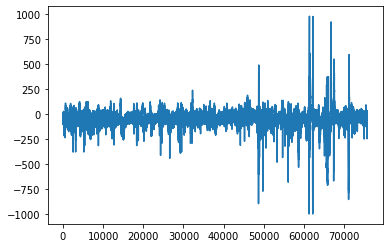

In [ ]:
# cwd = os.path.abspath(data_path)
# files = [f for f in os.listdir(cwd) if os.path.isfile(os.path.join(cwd, f))]
# print(files)
# blink = pd.read_csv(data_path+files[1])
# plt.plot(blink.iloc[:,1])

In [3]:
def get_signals(data_path):

    cwd = os.path.abspath(data_path)
    files = [f for f in os.listdir(cwd) if os.path.isfile(os.path.join(cwd, f))]

    ## Method 1 gets the first sheet of a given file
    blinks = pd.DataFrame()
    noBlinks = pd.DataFrame()
    for file in files:
        if file.endswith('.csv'):
          if file.startswith('Blink'):
            blink = pd.read_csv(data_path+file)
            blinks = blinks.append(blink, ignore_index=True)
          else :
            noBlink = pd.read_csv(data_path+file)
            noBlinks = noBlinks.append(noBlink, ignore_index=True)

    blinks = blinks.drop(['timestamps','Right AUX'], axis = 1)
    noBlinks = noBlinks.drop(['timestamps','Right AUX'], axis = 1)
    noBlinks = noBlinks.dropna()

    return blinks, noBlinks

In [ ]:
# def get_files(data_path):

#     # inputs:
#     # outputs:

#     # reading signal files
#     signal_files = [f for f in os.listdir(data_path) if os.path.isfile(os.path.join(data_path, f)) and '_data' in f]
#     label_files = [f for f in os.listdir(data_path) if os.path.isfile(os.path.join(data_path, f)) and '_labels' in f]

#     return signal_files, label_files
# signal_files, label_files = get_files(data_path)

In [ ]:
# def get_signals(signal_files, data_path, file_idx):

#     # inputs:
#     # outputs:

#     # reading signals file
#     signals = signal_files[file_idx]
#     signals = np.loadtxt(open(os.path.join(data_path,signals), "rb"), delimiter=";", skiprows=1, usecols=(0,1,2))

#     return signals
# signals = get_signals(signal_files, data_path, 0)
# print(signals)

[[ 0.00000000e+00  8.26795508e+03 -8.17984424e+03]
 [ 3.90625000e-03  8.07798730e+03 -8.25058691e+03]
 [ 7.81250000e-03  8.48078809e+03 -8.05476367e+03]
 ...
 [ 1.02259766e+02  2.48066357e+03 -1.14376553e+04]
 [ 1.02263672e+02  2.18854858e+03 -1.15647256e+04]
 [ 1.02267578e+02  2.00879590e+03 -1.16199785e+04]]


In [ ]:
# def get_blinks(label_files, data_path, file_idx, signals):

#     # inputs:
#     # ouputs:

#     # reading labels file
#     labels = label_files[file_idx]

#     # parsing labels file
#     interval_corrupt = []
#     blinks = []
#     n_corrupt = 0
#     with open(os.path.join(data_path,labels)) as csvfile:
#         readCSV = csv.reader(csvfile, delimiter=',')
#         for row in readCSV:
#             if row[0]=="corrupt":
#                 n_corrupt = int(row[1])
#             elif n_corrupt > 0:
#                 if float(row[1]) == -1:
#                     t_end = signals[-1,0]
#                 else:
#                     t_end = float(row[1])
#                 interval_corrupt.append([float(row[0]), t_end])
#                 n_corrupt = n_corrupt - 1
#             elif row[0]=="blinks":
#                 if not n_corrupt==0:
#                     print("!Error in parsing")
#             else:
#                 blinks.append([float(row[0]), int(row[1])])
#     blinks = np.array(blinks)

#     return interval_corrupt, blinks

# interval_corrupt, blinks = get_blinks(label_files, data_path, 0, signals)
# print('interval corrupt : ', interval_corrupt)
# print('blinks : ', blinks)

In [ ]:
# def butter_filter(signal, fs, fc, btype = 'low'):
#     filtered_signal = []

#     # inputs:
#     # outputs:
#     w = fc / (fs / 2) # Normalize the frequency
#     b, a = butter(5, w, btype)
#     for i in range(signal.shape[1]):
#         filtered = filtfilt(b, a, signal.iloc[:,i])
#         filtered_signal.append(filtered)
#     return np.array(filtered_signal)

In [ ]:
# def clean_windows(windows, windows_times, interval_corrupt):

#     # inputs:
#     # outputs:

#     cleaned_windows = []
#     cleaned_windows_times = []

#     if len(interval_corrupt) == 0:
#         cleaned_windows = windows
#         cleaned_windows_times = windows_times
#     else:
#         for i in range(len(interval_corrupt)):
#             for j in range(len(windows_times)):
#                 if not(interval_corrupt[i][0] <= windows_times[j][-1] and windows_times[j][0] <= interval_corrupt[i][-1]):
#                     cleaned_windows.append(windows[j])
#                     cleaned_windows_times.append(windows_times[j])
#     cleaned_windows = np.array(cleaned_windows)
#     cleaned_windows_times = np.array(cleaned_windows_times)
#     return cleaned_windows, cleaned_windows_times

# cleaned_windows, cleaned_windows_times = clean_windows(windows, windows_times, interval_corrupt)


In [13]:
def get_windows(signal, window_size, window_stride):

    windows = []
    # windows_times = []
    window_features = []
    # if len(signal[0]) == len(time):
    for j in range(0, len(signal)-window_size, window_stride):
        # window_time = time[j:j+window_size]
        # windows_times.append(window_time)

        for i in range(len(signal[0])):
            window_feature = signal[j:j+window_size,i]
            window_features.append(window_feature)
        windows.append(window_features)
        window_features = []
    windows = np.array(windows)
    # windows_times = np.array(windows_times)
    return windows

In [ ]:
# def get_labels(windows_times, blinks):

#     # inputs:
#     # outputs:

#     labels = [0 for _ in range(len(windows_times))]

#     for i in range(len(windows_times)):
#         w_start = windows_times[i][0]
#         w_end = windows_times[i][-1]
#         for j in range(len(blinks)):
#             if (blinks[j][0] >= w_start and blinks[j][0] <= w_end):
#                 labels[i] = 1
#     labels = np.array(labels)
#     return labels
# labels = get_labels(windows_times, blinks)
# print(labels)

In [5]:
def get_labels(noBlinksData, blinksData):
    return [0 for _ in range(noBlinksData.shape[0])], [1 for _ in range(blinksData.shape[0])]

In [6]:
def cocatenate_and_randomize(windows_noBlinks, noBlinkingLabels, windows_blinks, BlinkingLabels):
    random.seed(4)
    blinkingWithNoise = np.concatenate((windows_noBlinks, windows_blinks), axis=0)
    blinkingWithNoise_labels = np.concatenate((noBlinkingLabels, BlinkingLabels), axis=0)
    temp = list(zip(blinkingWithNoise, blinkingWithNoise_labels))
    random.shuffle(temp)
    blinkingWithNoise_randomized, blinkingWithNoise_labels_randomized = zip(*temp)
    # blinkingWithNoise_randomized and blinkingWithNoise_labels_randomized come out as tuples, and so must be converted to lists.
    return list(blinkingWithNoise_randomized), list(blinkingWithNoise_labels_randomized)

In [15]:
def create_dataset_without_filter(data_pathes, fs = 250.0, fc_low = 1, fc_high = 1):

    # inputs:
    # outputs:
    blinks = pd.DataFrame()
    noBlinks = pd.DataFrame()
    X = []
    Y = []
    Wt = []
    i = 0
    # signal_files, label_files = get_files(data_path)

    # for i in range(len(signal_files)):
    # file_idx = i
    for data_path in data_pathes:
      blinks_file, noBlinks_file = get_signals(data_path)
      blinks = pd.concat([blinks, blinks_file], axis=0)
      noBlinks = pd.concat([noBlinks, noBlinks_file], axis=0)
    # interval_corrupt, blinks = get_blinks(label_files, data_path, file_idx, signals)
    # time = signals[:,0]
    # signal = signals[:,1:3]
    # filtered_signal_blinks = butter_filter(blinks, fs, fc_low, 'high')
    # filtered_signal_noBlinks = butter_filter(noBlinks, fs, fc_low, 'high')
    #filtered_signal = butter_filter(filtered_signal, fs, fc = fc_low)
    blinks = np.array(blinks)
    noBlinks = np.array(noBlinks)
    windows_blinks = get_windows(blinks, 200, 100)
    windows_noBlinks = get_windows(noBlinks, 200, 100)
    while i < len(windows_blinks):
      if np.max(abs(windows_blinks[i])) < 200 :
        # plt.plot(np.reshape(windows_blinks[i], [200,4]))
        windows_blinks = np.delete(windows_blinks, i, axis=0)
        i -= 1
        # print(j)
        # plt.show()
      i += 1

    # cleaned_windows, cleaned_windows_times = clean_windows(windows, windows_times, interval_corrupt)
    noBlinkingLabels, BlinkingLabels = get_labels(windows_noBlinks, windows_blinks)

    # for j in range(len(windows)):
    #     X.append(windows[j])00
    #     Y.append(labels[j])
    #     Wt.append(windows_times[j])

    #     X = np.array(X)
    #     Y = np.array(Y)
    #     Wt = np.array(Wt)
    X, Y = cocatenate_and_randomize(windows_noBlinks, noBlinkingLabels, windows_blinks, BlinkingLabels)
    X = np.array(X)
    Y = np.array(Y)

    return X, Y

In [ ]:
# H = XX[2]
# w = 1 / (250 / 2) # Normalize the frequency
# b, a = butter(5, w, 'high')
# window_fedfgdfgatures = []
# for i in range(H.shape[0]):
#   filtered = filtfilt(b, a, H[i])
#   window_fedfgdfgatures.append(filtered)
# window_fedfgdfgatures = np.reshape(window_fedfgdfgatures, [400, 4])
# plt.plot(range(len(window_fedfgdfgatures)), window_fedfgdfgatures);

In [ ]:
# print(X[0].shape)
# k = np.reshape(X[0], [200,4])
# plt.plot(range(len(k)), k);

In [ ]:
# def create_dataset_with_filter(data_path, fs = 250.0, fc_low = 1, fc_high = 1):
#     # inputs:
#     # outputs:
#     X = []
#     Y = []
#     Wt = []
#     # signal_files, label_files = get_files(data_path)

#     # for i in range(len(signal_files)):
#     # file_idx = i
#     blinks, noBlinks = get_signals(data_path)
#     # interval_corrupt, blinks = get_blinks(label_files, data_path, file_idx, signals)
#     # time = signals[:,0]
#     # signal = signals[:,1:3]
#     filtered_signal_blinks = butter_filter(blinks, fs, fc_low, 'high')
#     filtered_signal_noBlinks = butter_filter(noBlinks, fs, fc_low, 'high')
#     #filtered_signal = butter_filter(filtered_signal, fs, fc = fc_low)
#     windows_blinks = get_windows(filtered_signal_blinks, 200, 100)
#     windows_noBlinks = get_windows(filtered_signal_noBlinks, 200, 100)

#     # cleaned_windows, cleaned_windows_times = clean_windows(windows, windows_times, interval_corrupt)
#     noBlinkingLabels, BlinkingLabels = get_labels(windows_noBlinks, windows_blinks)

#     # for j in range(len(windows)):
#     #     X.append(windows[j])
#     #     Y.append(labels[j])
#     #     Wt.append(windows_times[j])

#     #     X = np.array(X)
#     #     Y = np.array(Y)
#     #     Wt = np.array(Wt)
#     X, Y = cocatenate_and_randomize(windows_noBlinks, noBlinkingLabels, windows_blinks, BlinkingLabels)
#     X = np.array(X)
#     Y = np.array(Y)

#     return X, Y

In [16]:
data_pathes = [data_path_mohab_old, data_path_mohab, data_path_mansour,
               data_path_tarek, data_path_anas, data_path_abdelrahman]
# data_pathes = [data_path_tarek]
# data_pathes = [data_path_mohab_old, data_path_mohab]

X, Y = create_dataset_without_filter(data_pathes)
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
# X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.2, random_state=42)

# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2)
# X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.2)

# X_train = X_train.reshape(X_train.shape[0], X_train.shape[2], X_train.shape[1])
# X_val = X_val.reshape(X_val.shape[0], X_val.shape[2], X_val.shape[1])
# X_test = X_test.reshape(X_test.shape[0], X_test.shape[2], X_test.shape[1])


<ipython-input-3-ecfe744b96ac>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  blinks = blinks.append(blink, ignore_index=True)
<ipython-input-3-ecfe744b96ac>:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noBlinks = noBlinks.append(noBlink, ignore_index=True)
<ipython-input-3-ecfe744b96ac>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  blinks = blinks.append(blink, ignore_index=True)
<ipython-input-3-ecfe744b96ac>:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  noBlinks = noBlinks.append(noBlink, ignore_index=True)
<ipython-input-3-ecfe744b96ac>:13: FutureWarning: The frame.append method is deprecated and will be removed from

In [11]:
# early_stopping = EarlyStopping(
#     min_delta=0.001, # minimium amount of change to count as an improvement
#     patience=20, # how many epochs to wait before stopping
#     restore_best_weights=True,
# )

In [17]:
def create_model(X_train):
  model = Sequential([

      # first convolution block
      layers.Conv1D(filters=16, kernel_size=5, activation='relu', input_shape = X_train[0].shape),
      layers.MaxPool1D(),

      # second convolution block
      layers.Conv1D(filters=32, kernel_size=3, activation='relu'),
      layers.MaxPool1D(),

      # third convolution block
      layers.Conv1D(filters=64, kernel_size=1, activation='relu'),
      layers.MaxPool1D(),

      # fourth convolution block
      layers.Conv1D(filters=128, kernel_size=3, activation='relu'),
      layers.MaxPool1D(),

      # fifth convolution block
      layers.Conv1D(filters=256, kernel_size=5, activation='relu'),
      layers.MaxPool1D(),

      # classifier head
      layers.Flatten(),
      layers.Dense(16, activation='relu', input_shape = (500,)),
      layers.Dense(32, activation='relu'),
      layers.Dense(64, activation='relu'),
      layers.Dense(1, activation='sigmoid'),
  ])
  model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['binary_accuracy'],
  )
  return model

In [18]:
# Define the number of cross-validation folds
n_folds = 5

# Define the cross-validation iterator
cv = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=42)

# Perform cross-validation
for train_index, val_index in cv.split(X, Y):
    # Split the data into training and validation sets
    X_train, X_val = X[train_index], X[val_index]
    Y_train, Y_val = Y[train_index], Y[val_index]
    X_train = np.transpose(X_train, (0, 2, 1))
    X_val = np.transpose(X_val, (0, 2, 1))

    #create model
    model = create_model(X_train)

    # Fit the model on the training data

    history = model.fit(
    X_train,
    Y_train,
    epochs = 10,
    batch_size = 32
    )

    # Evaluate the model on the validation data
    loss, acc = model.evaluate(X_val, Y_val, verbose = 0)

    # Print the validation accuracy for this fold
    print('Validation accuracy: %.3f' % acc)

# history = model.fit(
#     X_train,
#     Y_train,
#     validation_data = (X_val, Y_val),
#     epochs = 200,
#     batch_size = 32,
#     callbacks = [early_stopping]
# )

Epoch 1/10
124/124 [==============================] - 9s 52ms/step - loss: 0.3535 - binary_accuracy: 0.8532
Epoch 2/10
124/124 [==============================] - 5s 44ms/step - loss: 0.2175 - binary_accuracy: 0.9177
Epoch 3/10
124/124 [==============================] - 6s 45ms/step - loss: 0.1714 - binary_accuracy: 0.9371
Epoch 4/10
124/124 [==============================] - 4s 30ms/step - loss: 0.1665 - binary_accuracy: 0.9356
Epoch 5/10
124/124 [==============================] - 4s 31ms/step - loss: 0.1352 - binary_accuracy: 0.9543
Epoch 6/10
124/124 [==============================] - 5s 37ms/step - loss: 0.1022 - binary_accuracy: 0.9631
Epoch 7/10
124/124 [==============================] - 5s 38ms/step - loss: 0.0928 - binary_accuracy: 0.9682
Epoch 8/10
124/124 [==============================] - 4s 31ms/step - loss: 0.0673 - binary_accuracy: 0.9795
Epoch 9/10
124/124 [==============================] - 4s 31ms/step - loss: 0.0657 - binary_accuracy: 0.9778
Epoch 10/10
124/124 [=======

In [ ]:
# X_Testing = np.array(X_Testing)
# X_Testing = X_Testing.reshape([X_Testing.shape[0], X_Testing.shape[2], X_Testing.shape[1]])
# X = np.array(X)
# X = X.reshape([X.shape[0], X.shape[2], X.shape[1]])

In [20]:
cwd = os.path.abspath('gdrive/MyDrive/Blinking_CNN_Data/mohab/')
files = [f for f in os.listdir(cwd) if os.path.isfile(os.path.join(cwd, f))]
## Method 1 gets the first sheet of a given file
data_blink = pd.DataFrame()
data_noblink = pd.DataFrame()
for file in files:
    if file.startswith('Blink'):
      blink = pd.read_csv('gdrive/MyDrive/Blinking_CNN_Data/mohab/'+file)
      data_blink = data_blink.append(blink, ignore_index=True)
    else :
      noBlink = pd.read_csv('gdrive/MyDrive/Blinking_CNN_Data/mohab/'+file)
      data_noblink = data_noblink.append(noBlink, ignore_index=True)

data_blink = data_blink.drop(['timestamps','Right AUX'], axis = 1)
data_noblink = data_noblink.drop(['timestamps','Right AUX'], axis = 1)
data_noblink = data_noblink.dropna()
data_blink = data_blink.dropna()

<ipython-input-20-8da96bebf389>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_blink = data_blink.append(blink, ignore_index=True)
<ipython-input-20-8da96bebf389>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_noblink = data_noblink.append(noBlink, ignore_index=True)
<ipython-input-20-8da96bebf389>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_blink = data_blink.append(blink, ignore_index=True)
<ipython-input-20-8da96bebf389>:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_blink = data_blink.append(blink, ignore_index=True)
<ipython-input-20-8da96bebf389>:9: FutureWarning: The frame.append method is deprecat

In [ ]:
# closed = pd.read_csv('EyeClosed1.csv')
# closed = pd.read_csv('gdrive/MyDrive/CNN_Data/mohab/Blink_recording_2023-03-05-14.08.52 (4).csv')
# closed = closed.drop(['timestamps','Right AUX'], axis = 1)
# closed = closed.dropna()
# print(closed)
# closed = np.array(closed)

# closed = get_windows(np.reshape(closed, [closed.shape[1], closed.shape[0]]), 200, 100)
# closed = closed.reshape(closed.shape[0], closed.shape[2], closed.shape[1])

# i = 0

# while i < len(closed):
#   if np.max(abs(closed[i])) < 200:
#     # plt.plot(np.reshape(closed[i], [200,4]))

#     closed = np.delete(closed, i, axis=0)
#     i -= 1
#     # plt.show()
#   i += 1

# closed_label = [1 for _ in range(closed.shape[0])]
# closed_label = np.array(closed_label)


data_blink = np.array(data_blink)
data_noblink = np.array(data_noblink)

data_blink = get_windows(np.transpose(data_blink), 200, 100)
data_noblink = get_windows(np.transpose(data_noblink), 200, 100)

data_blink = np.transpose(data_blink, (0, 2, 1))
data_noblink = np.transpose(data_noblink, (0, 2, 1))
i = 0
while i < len(data_blink):
  if np.max(abs(data_blink[i])) < 200:
    # plt.plot(np.reshape(closed[i], [200,4]))

    data_blink = np.delete(data_blink, i, axis=0)
    i -= 1
    # plt.show()
  i += 1

data_label_noblink = [0 for _ in range(data_noblink.shape[0])]
data_label_blink = [1 for _ in range(data_blink.shape[0])]

data_label_blink = np.array(data_label_blink)
data_label_noblink = np.array(data_label_noblink)
XX, YY = cocatenate_and_randomize(data_noblink, data_label_noblink, data_blink, data_label_blink)

XX = np.array(XX)
YY = np.array(YY)

30/30 [==============================] - 0s 8ms/step - loss: 0.1767 - binary_accuracy: 0.9398
test loss, test acc: [0.1767234206199646, 0.9397849440574646]
30/30 [==============================] - 0s 8ms/step


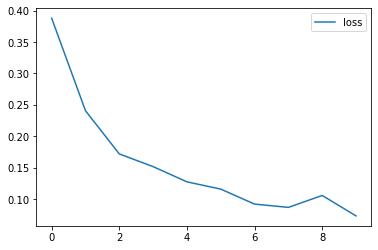

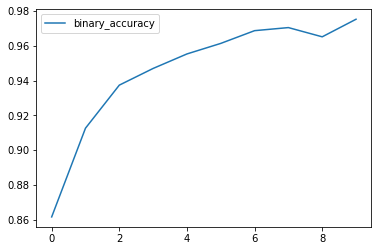

In [ ]:
history_frame = pd.DataFrame(history.history)
history_frame.loc[:, ['loss']].plot();
history_frame.loc[:, ['binary_accuracy']].plot();

scores = model.evaluate(XX, YY)
print("test loss, test acc:", scores)

preds = model.predict(XX)

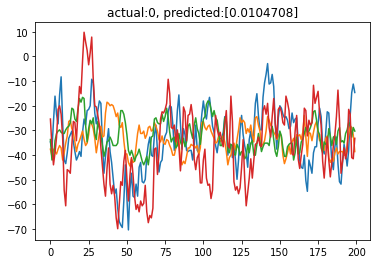

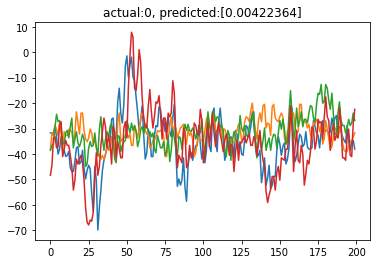

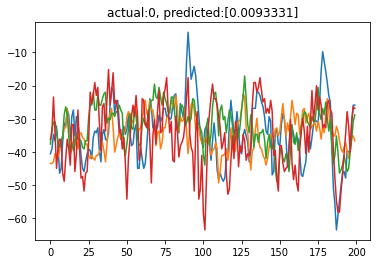

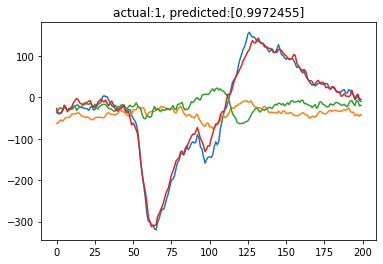

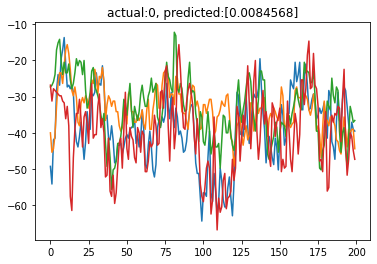

...

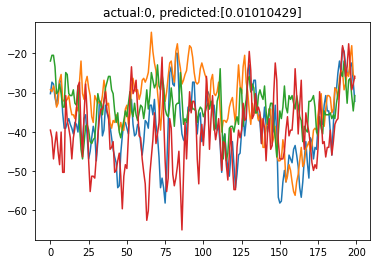

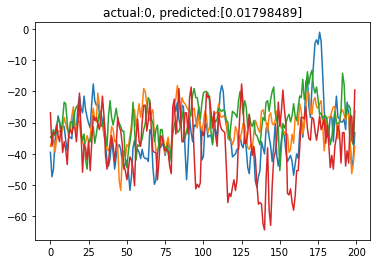

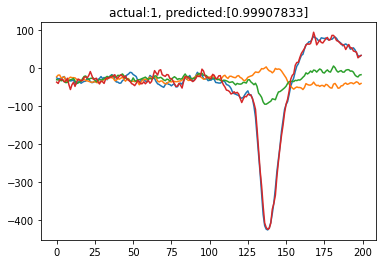

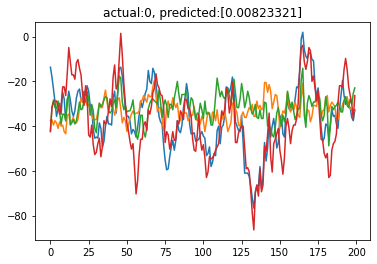

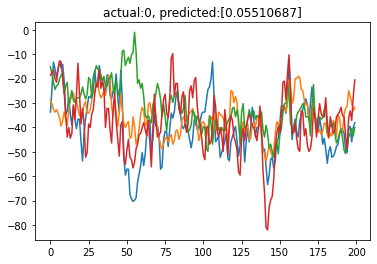

KeyboardInterrupt: ignored

In [ ]:
for s in range(0, 100, 1):
  plt.title("actual:{}, predicted:{}".format(YY[s], preds[s]))
  plt.plot(range(len(XX[s])), XX[s]);
  plt.show()

In [ ]:
# predsNotFiltered = model.predict(X_Testing)
# s=0
# plt.title("actual:{}, predicted:{}".format(Y_Testing[s], predsNotFiltered[s]))
# plt.plot(range(len(X_Testing[s])), X_Testing[s]);

(930,)


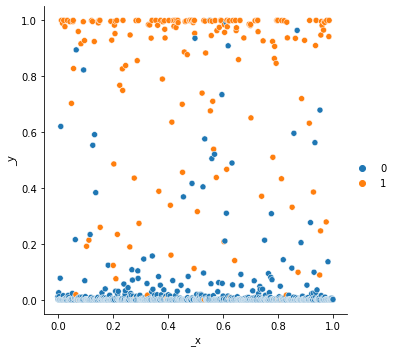

In [ ]:
y_pred = np.reshape(preds, (len(preds),))
Range = np.linspace(min(y_pred), max(y_pred), len(y_pred))
print(Range.shape)
sns.relplot(x=Range, y=y_pred, hue=YY)

In [ ]:
model.save('Downloads')
# Convert the model to the TensorFlow Lite format without quantization
converter = tf.lite.TFLiteConverter.from_saved_model('Downloads')
converter.target_spec.supported_ops = [
  tf.lite.OpsSet.TFLITE_BUILTINS, # enable TensorFlow Lite ops.
  tf.lite.OpsSet.SELECT_TF_OPS # enable TensorFlow ops.
]
model_no_quant_tflite = converter.convert()

# Save the model to disk
open('model.tflite', "wb").write(model_no_quant_tflite)

843136

In [ ]:
# # Prepare the test data
# x_test_ = df_test.copy()
# x_test_ = x_test_.reshape((df_test.size, 1))
# x_test_ = x_test_.astype(np.float32)
# Initialize the TFLite interpreter
# filename = 'BlinkingCNN.tflite'
# interpreter = tf.lite.Interpreter(model_path=filename)
interpreter = tf.lite.Interpreter(model_content=model_no_quant_tflite)

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
print(input_details)
interpreter.allocate_tensors()
# Invoke the interpreter
X_test = np.float32(XX)

y_pred = np.empty(len(X_test), dtype=output_details[0]["dtype"])
for i in range(len(X_test)):
  interpreter.set_tensor(input_details[0]["index"], [X_test[i]])
  interpreter.invoke()
  y_pred[i] = interpreter.get_tensor(output_details[0]["index"])


[{'name': 'serving_default_conv1d_80_input:0', 'index': 0, 'shape': array([  1, 200,   4], dtype=int32), 'shape_signature': array([ -1, 200,   4], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': array([], dtype=float32), 'zero_points': array([], dtype=int32), 'quantized_dimension': 0}, 'sparsity_parameters': {}}]


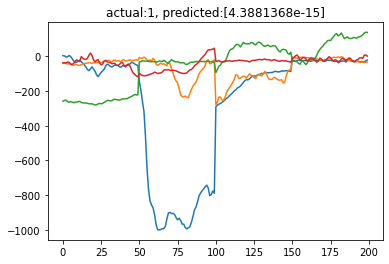

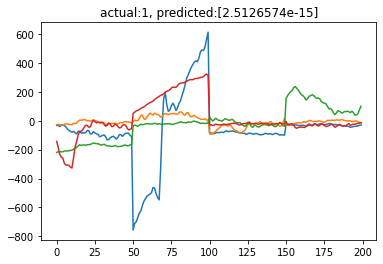

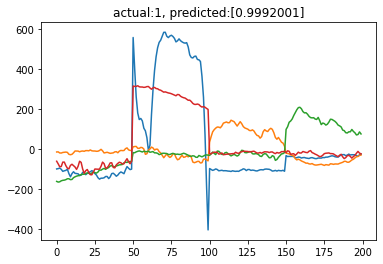

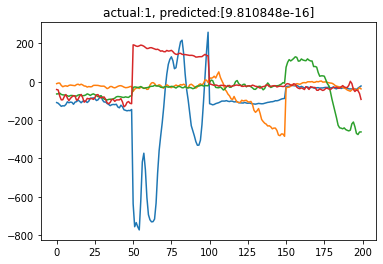

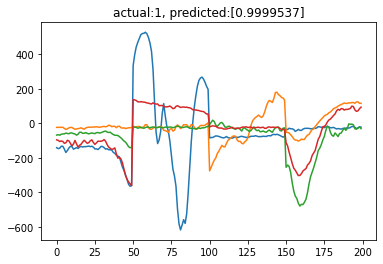

...

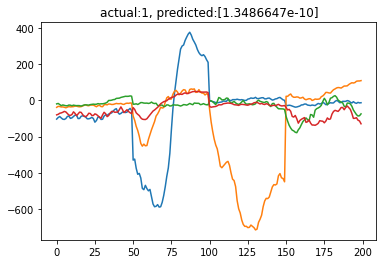

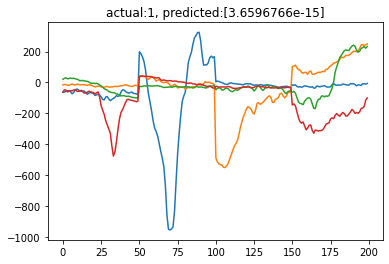

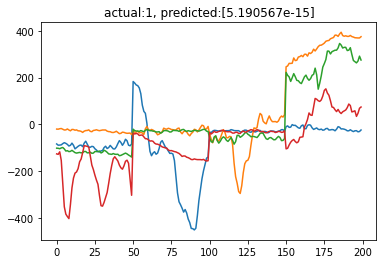

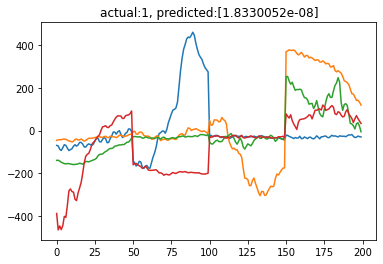

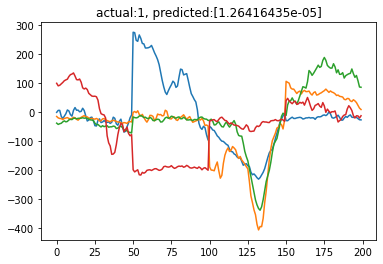

In [ ]:
# for s in range(0, len(closed_label), 1):
#   plt.title("actual:{}, predicted:{}".format(closed_label[s], preds[s]))
#   plt.plot(range(len(closed[s])), closed[s]);
#   plt.show()

In [ ]:
# predictions = np.concatenate((predsNotFiltered, preds), axis = 0)
# predictions_labels = np.concatenate((Y_test, closed_label), axis = 0)
# h = [1 if x > 0.6 else 0 for x in predictions]
# confusion_matrix = metrics.confusion_matrix(predictions_labels, h)
# cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = ['Regular', 'blinks'])
# cm_display.plot()
# plt.show()

(783,)


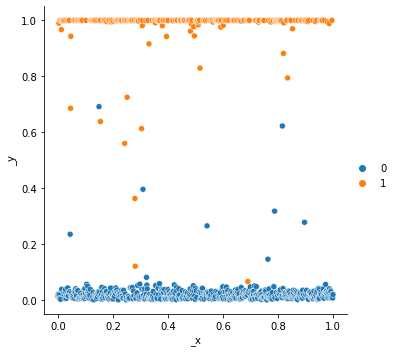

In [ ]:
y_pred = np.reshape(preds, (len(preds),))
Range = np.linspace(min(y_pred), max(y_pred), len(y_pred))
print(Range.shape)
sns.relplot(x=Range, y=y_pred, hue=YY)

(783,)


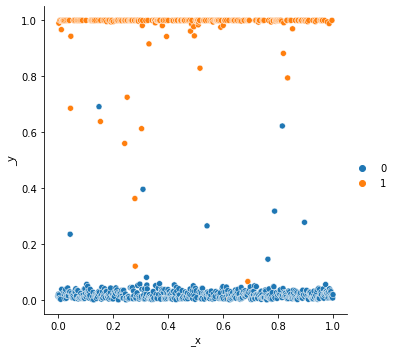

In [ ]:
y_pred = np.empty(len(XX), dtype=output_details[0]["dtype"])
X_test = np.float32(XX)
for i in range(len(X_test)):
  interpreter.set_tensor(input_details[0]["index"], [X_test[i]])
  interpreter.invoke()
  y_pred[i] = interpreter.get_tensor(output_details[0]["index"])
y_pred = np.reshape(y_pred, (len(y_pred),))
Range = np.linspace(min(y_pred), max(y_pred), len(y_pred))
print(Range.shape)
sns.relplot(x=Range, y=y_pred, hue=YY)